In [1]:
%matplotlib widget
import logging
logging.basicConfig(level=logging.INFO)
logging.getLogger("simulation").setLevel(logging.DEBUG)
logging.getLogger("simfmri").setLevel(logging.DEBUG)
logging.getLogger("fmri").setLevel(logging.DEBUG)


import numpy as np
import matplotlib.pyplot as plt 
import pandas as pd
from matplotlib_inline.backend_inline import set_matplotlib_formats
from fmri.visualisation import mosaic

In [2]:
set_matplotlib_formats('pdf', 'svg')

# Create Simulation 

In [3]:
from simfmri.simulator import (
    SimulationData, H,
    list_handlers
)

In [4]:
sim = SimulationData(
    (64, 64), sim_tr=0.1, sim_time=300, fov=0.192, n_coils=4, rng=42, lazy=True
)
# %%
# Initialize the simulator
# ------------------------
# We initialize the simulator from the availables handlers

print(list_handlers())

simulator = (
    H("phantom-big")(roi_index=None)
    >> H("phantom-roi")()
    >> H("activation-block")(
        block_on=20, block_off=20, duration=300, bold_strength=0.05, 
    )
    >> H("noise-gaussian")(snr=150)
    >> H("acquisition-vds")(
        acs=0.1,
        accel=2,
        accel_axis=1,
        direction="center-out",
        shot_time_ms=25,
        constant=False,
    )
)

['acquisition-generic', 'acquisition-vds', 'acquisition-radial', 'acquisition-sos', 'activation-block', 'noise-gaussian', 'noise-rician', 'noise-kspace', 'phantom-shepp_logan', 'phantom-big', 'phantom-roi', 'phantom-brainweb', 'phantom-texture', 'phantom-slicer']


In [5]:
sim = simulator(sim)


DEBUG:simulation.BigPhantomGeneratorHandler:start handling
DEBUG:simulation.BigPhantomGeneratorHandler:end handling: 0.62s
DEBUG:simulation.RoiDefinerHandler:start handling
DEBUG:simulation.RoiDefinerHandler:end handling: 0.00s
DEBUG:simulation.ActivationBlockHandler:start handling
INFO:simulation.ActivationBlockHandler:Simulated block activations at sim_tr=0.1s
DEBUG:simulation.ActivationBlockHandler:end handling: 1.26s
DEBUG:simulation.GaussianNoiseHandler:start handling
DEBUG:simulation.GaussianNoiseHandler:end handling: 0.00s
DEBUG:simulation.VDSAcquisitionHandler:start handling
DEBUG:simulation.VDSAcquisitionHandler:initial TR volume 875 ms
DEBUG:simulation.VDSAcquisitionHandler:n_kspace_frame 343
DEBUG:simulation.VDSAcquisitionHandler:n_tot_shots 12000
DEBUG:simulation.VDSAcquisitionHandler:n_shot_traj 35
DEBUG:simulation.VDSAcquisitionHandler:n_shot_sim_frame 4


  0%|          | 0/3000 [00:00<?, ?it/s]

DEBUG:simulation.acquisition.trajectory:full trajectory has 35 shots
DEBUG:simulation.VDSAcquisitionHandler:end handling: 4.00s


In [6]:
sim.extra_infos

{'events':   trial_type  onset  duration  modulation
 0   block_on      0        20           1
 1   block_on     40        20           1
 2   block_on     80        20           1
 3   block_on    120        20           1
 4   block_on    160        20           1
 5   block_on    200        20           1
 6   block_on    240        20           1
 7   block_on    280        20           1,
 'input_snr': 100,
 'TR_ms': 875,
 'traj_name': 'vds',
 'traj_constant': False,
 'traj_params': {'acs': 0.1,
  'accel': 2,
  'accel_axis': 1,
  'direction': 'center-out',
  'pdf': 'gaussian',
  'rng': Generator(PCG64) at 0x7F7E5BDFD0E0},
 'n_shot_per_frame': 35}

### Some plotting

In [7]:
sim.n_coils

4

(-0.5, 63.5, 63.5, -0.5)

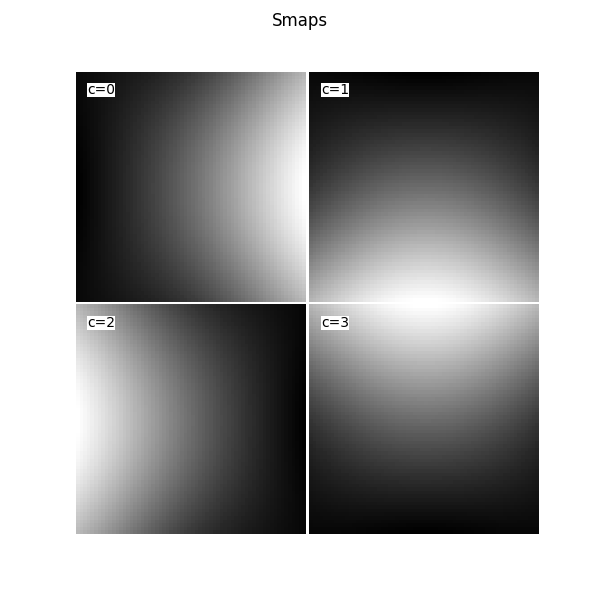

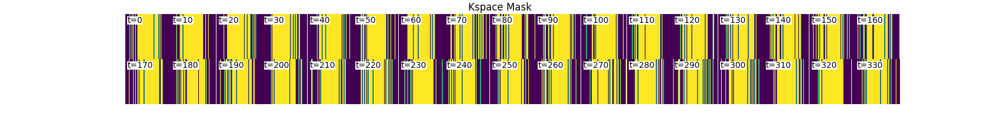

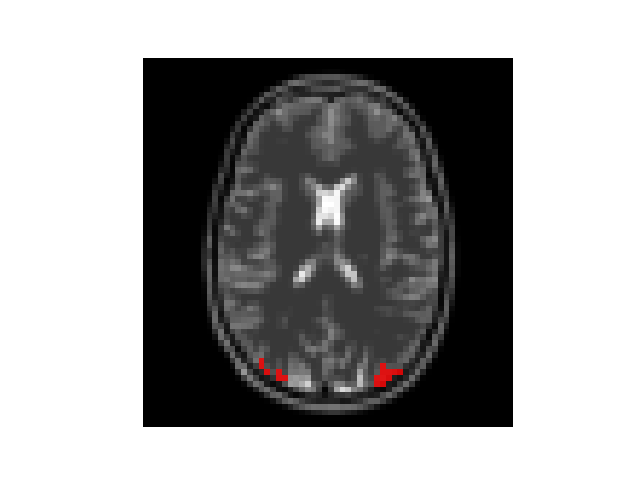

In [8]:
fig =mosaic(sim.smaps, axis=0, axis_label="c");
fig.suptitle("Smaps")
fig2 = mosaic(sim.kspace_mask, axis=0, cmap="viridis", samples=0.1, img_w=1, n_rows=2)
fig2.suptitle("Kspace Mask")
fig3 = plt.figure()
plt.imshow(sim.data_ref[0], cmap="gray")
plt.imshow(np.ma.masked_where(sim.roi ==0, sim.roi), cmap="autumn", vmax=1,alpha=0.8)
plt.axis("off")

In [6]:
def plot_ts_roi(arr, sim, roi_idx, ax=None, center=False, **kwargs):
    if ax is None:
        fig, ax= plt.subplots()
        ax.set_xlabel("time (s)")
    N = len(arr)
    time_samples = np.arange(N, dtype=np.float64) 
    time_samples *= sim.sim_tr if N == len(sim.data_ref) else sim.extra_infos["TR_ms"] /1000

    arr_ = np.abs(arr) if np.iscomplexobj(arr) else arr
    arr_ = arr_[:, sim.roi]
        
    if roi_idx is None: 
        ts = np.mean(arr_, axis=-1)
        if center:
            mean_val =  np.mean(ts, axis=0)
            ts -= mean_val                
            #tsmin = np.percentile(ts,5,  axis=0)
            #tsmax = np.percentile(ts,95,  axis=0)
            ts_plot = ax.plot(time_samples, ts, **kwargs)
            #ax.fill_between(time_samples, tsmin, tsmax, color=ts_plot[0].get_color(), alpha=0.1)
    else:
        ts = arr_[:, roi_idx]
        if center:
            ts -= np.mean(ts, axis=0)
        ax.plot(time_samples,ts, **kwargs) 
    return ax

def plot_ts_roi_many(arr_dict, sim, roi_idx, ax=None, center=False, **kwargs):
    if ax is None:
        fig, ax = plt.subplots()
    for label, arr in arr_dict.items():
        if label == "acquired":
            kwargs2 = kwargs.copy()
            kwargs2["c"] = "gray"
            kwargs2["alpha"]=0.5
            kwargs2["zorder"] = 0
            plot_ts_roi(arr, sim, roi_idx, ax=ax, label=label, center=center,**kwargs2)
        else:
            plot_ts_roi(arr, sim, roi_idx, ax=ax, label=label,center=center, **kwargs)
    ax.legend(loc='center left', bbox_to_anchor=(1, 0.5),borderaxespad=0.)
    
    return ax

In [7]:
RESULTS = dict()
RESULTS["ref"] = sim.data_ref
RESULTS["acquired"] = sim.data_acq

# Reconstructions Methods


In [8]:
from simfmri.runner.reconstructor import ZeroFilledReconstructor, SequentialReconstructor, LowRankPlusSparseReconstructor

In [7]:
sim.kspace_data.shape
sim.kspace_mask.shape

(342, 64, 64)

## Adjoint Reconstruction

In [42]:
adj_data = ZeroFilledReconstructor().reconstruct(sim)

In [43]:
data_acq = sim.data_acq[:, sim.roi]

/tmp/ipykernel_589786/4186930524.py:30: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots()


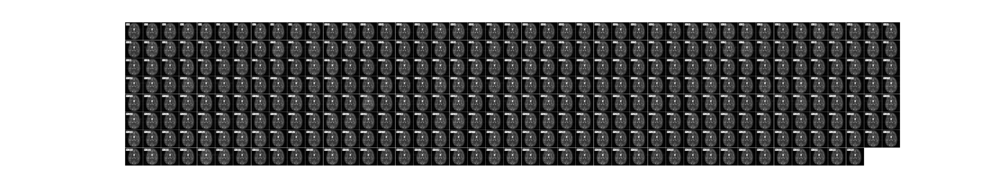

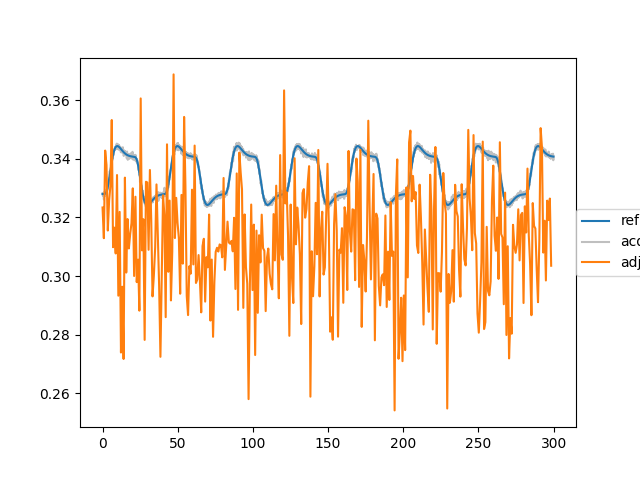

In [44]:
mosaic(adj_data, axis=0, img_w=1.5, n_rows=8);
RESULTS["adjoint"] = adj_data

ax = plot_ts_roi_many(RESULTS, sim, roi_idx=1)

## Sequential Reconstruction

In [45]:
seq_data = SequentialReconstructor(max_iter_per_frame=20, optimizer="pogm", wavelet="sym4").reconstruct(sim)
RESULTS["sequential"] = seq_data

/home/ciuciu/work/code/git/pysap-fmri/fmri/reconstructors/base.py:59: UserWarning: The in-time regularizer is not set. Setting to identity. Note that frame will be reconstruct independently.
  warnings.warn(


  0%|          | 0/342 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

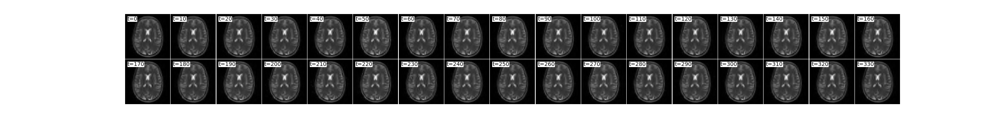

In [47]:
mosaic(seq_data, axis=0, samples=0.1, img_w=1.5, n_rows=2);


Text(0.5, 1.0, 'VDS Variable')

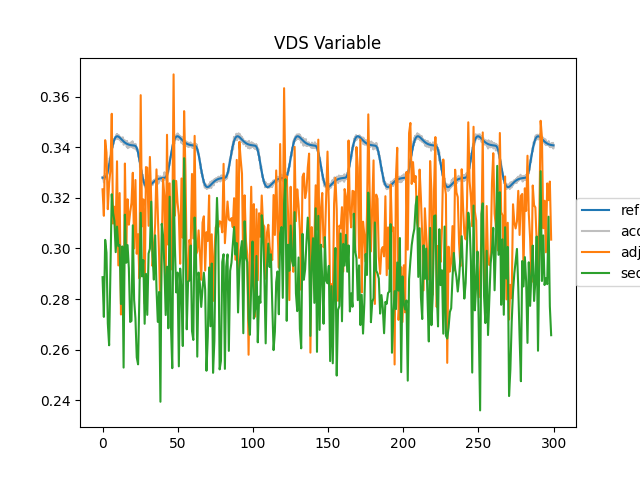

In [46]:
ax = plot_ts_roi_many(RESULTS, sim, roi_idx=1)
ax.set_title("VDS Variable")

## LowRank + Sparse Reconstruction

### Sparse Fourier

In [19]:
from fmri.operators.time_op import TimeFourier
#from fmri.operators.proximity import ProxTV1d
from fmri.operators.utils import sure_est, sigma_mad

time_linear_op = TimeFourier(0)
sure_thresh = np.zeros(np.prod(adj_data.shape[1:]))
sigmas = np.zeros(np.prod(adj_data.shape[1:]))
tf = time_linear_op.op(adj_data).reshape(len(adj_data), -1)
for i in range(len(sure_thresh)):
    sure_thresh[i] = sure_est(tf[:, i])
    sigmas[i] = sigma_mad(tf[:, i])
    

In [20]:
adj_data.shape[1:]

(64, 64)

0.029683273266296727
0.17054906
0.0050624544979855765


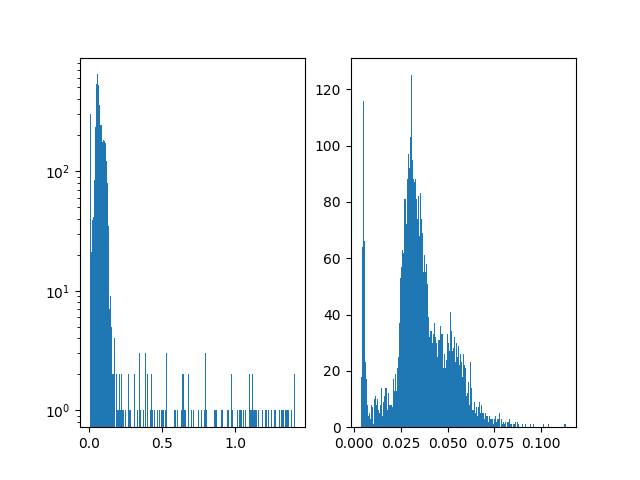

In [21]:
hybrid = np.sqrt(2* np.log(len(sim.kspace_data))) 
fig, ax = plt.subplots(1, 2)
_ = ax[0].hist(sure_thresh, bins=200, log=True)
_ = ax[1].hist(sigmas, bins=200)

#ax.axvline(hybrid, c='k')
print(sigma_mad(tf.flatten()))
print(sure_est(tf.flatten()))
print(sigma_mad(tf.flatten())* sure_est(tf.flatten()))

/home/ciuciu/work/code/git/myvenv_pysap2023/lib/python3.10/site-packages/matplotlib-3.8.0-py3.10-linux-x86_64.egg/matplotlib/cbook.py:1699: ComplexWarning: Casting complex values to real discards the imaginary part
  return math.isfinite(val)
/home/ciuciu/work/code/git/myvenv_pysap2023/lib/python3.10/site-packages/numpy/lib/histograms.py:841: ComplexWarning: Casting complex values to real discards the imaginary part
  indices = f_indices.astype(np.intp)
/home/ciuciu/work/code/git/myvenv_pysap2023/lib/python3.10/site-packages/matplotlib-3.8.0-py3.10-linux-x86_64.egg/matplotlib/axes/_axes.py:6857: ComplexWarning: Casting complex values to real discards the imaginary part
  bins = np.array(bins, float)  # causes problems if float16


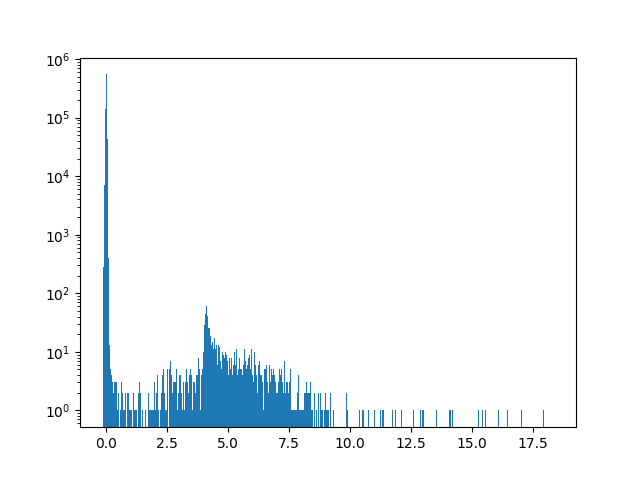

In [22]:
tf = time_linear_op.op(adj_data)

fig, ax = plt.subplots()
_=ax.hist(tf.flatten(), bins=1000, log=True)


#### With otazo algorithm

In [141]:
M = LowRankPlusSparseReconstructor(lambda_l=0.01, lambda_s="sure", algorithm="otazo", max_iter=40).reconstruct(sim)

INFO:simfmri.runner.reconstructor:SURE threshold: 1.0896e-03


  0%|          | 0/40 [00:00<?, ?it/s]

In [142]:
RESULTS["L+S(otazo)"] = M 

#### With POGM algorithm

In [143]:
M2 = LowRankPlusSparseReconstructor(lambda_l=0.01, lambda_s="sure", algorithm="pogm", max_iter=40).reconstruct(sim)
RESULTS["L+S(pogm)"] = M2

INFO:simfmri.runner.reconstructor:SURE threshold: 1.0896e-03


  0%|          | 0/40 [00:00<?, ?it/s]

In [144]:
M3 = LowRankPlusSparseReconstructor(lambda_l=0.01, lambda_s="sure", algorithm="otazo_raw", max_iter=40).reconstruct(sim)
RESULTS["L+S(raw)"] = M3

INFO:simfmri.runner.reconstructor:SURE threshold: 1.0896e-03


0.01 0.0010896256490048216


  0%|          | 0/40 [00:00<?, ?it/s]

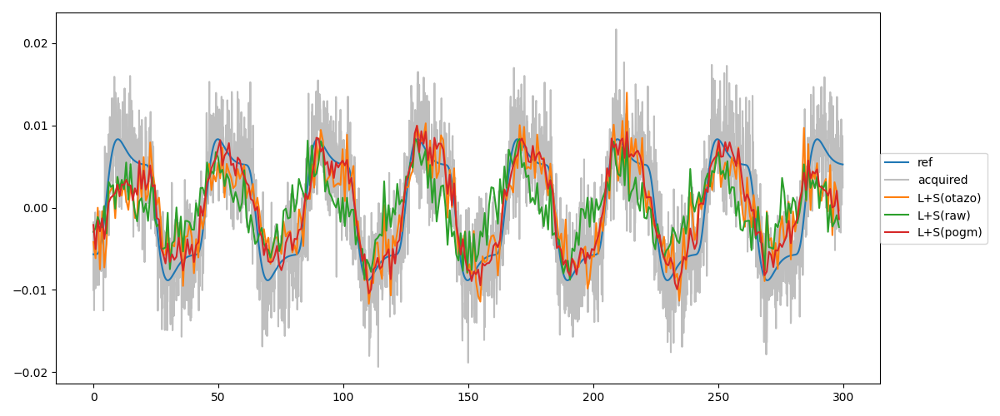

In [145]:
fig, ax = plt.subplots(figsize= (12,5))
#RESULTS.pop("adjoint")
#RESULTS.pop("sequential")
#RESULTS.pop("L+S(otazo)")
#RESULTS.pop("L+S(pogm)_0.1")
#RESULTS2= {}
#RESULTS2["L+S(pogm)"] = 
#ax = plot_ts_roi_many({k:v for k,v in RESULTS.items() if k not in ["L+S(pogm)"]}, sim, roi_idx=None, center=True, ax=ax)
ax = plot_ts_roi_many(RESULTS, sim, roi_idx=3, center=True, ax=ax)
fig.tight_layout()

In [ ]:
plt.figure(figsize=(8,6))
plt.plot([50, 150, 1000], [1.1902e-3,1.0896e-3,1.0744e-3]) 
plt.xlabel('SNR', fontsize=20)
plt.ylabel(r'$\lambda_t$', fontsize=20)
plt.title(r'$\lambda_t=f(SNR)$', fontsize=20)
plt.show()

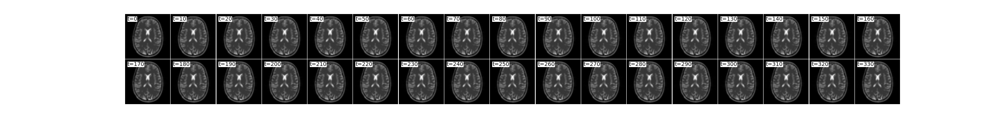

In [60]:
mosaic(M2, axis=0, samples=0.1, img_w=1.5, n_rows=2);


### Sparse Wavelet 

In [61]:
#from fmri.reconstructors.time_aware import LowRankPlusSparseReconstructor
from simfmri.runner.reconstructor import  LowRankPlusSparseReconstructor
from fmri.operators.time_op import WaveletTimeOperator
from fmri.operators.svt import FlattenSVT
from fmri.operators.utils import InTransformSparseThreshold

In [62]:
wavelet_time = WaveletTimeOperator(wavelet_name="sym4", shape=sim.shape, n_frames=len(sim.kspace_data), nb_scale=4, dim=1)
print(sim.shape)
print(len(sim.kspace_data))
wavelet_time.op(adj_data)
#np.prod(sim.shape)
#M4 = LowRankPlusSparseReconstructor(lambda_l=0.1, lambda_s=0.001, time_linear_op=wavelet_time, algorithm="pogm", max_iter=20).reconstruct(sim)
#RESULTS["L+W"] = M4

2
(64, 64)
342
(array([-5.88802959e-06+3.36141085e-07j,  3.15558063e-05-2.37577951e-05j,
        7.53183485e-05+1.42180448e-04j, -2.78456791e-05+8.61719236e-05j,
        3.28190654e-04+9.43782879e-07j, -7.61542178e-05+2.15349974e-05j,
       -4.88122460e-05+3.07372829e-08j,  2.52304832e-04+6.82476457e-05j,
        1.22041347e-05+6.75903793e-05j, -3.16394930e-04-1.75039459e-04j,
        1.37121489e-04+2.60026951e-04j,  2.58114393e-04-9.00150626e-05j,
       -1.72499014e-04+1.42207398e-04j,  1.94699634e-04-1.00799680e-05j,
        2.38098932e-04-3.53240694e-06j, -2.13855150e-04-2.40243869e-04j,
        7.15881033e-05-7.25268692e-05j,  7.46741280e-05+1.39012991e-04j,
        2.09668488e-05-1.69793464e-06j, -1.30168060e-04-9.77305026e-05j,
       -2.50449026e-04+1.93314496e-04j, -1.98410868e-04-4.64659788e-05j,
        1.28543805e-04+8.88072245e-05j, -1.54638081e-04+3.46938068e-05j,
        5.34245328e-06+1.29202363e-06j, -5.63790172e-06-6.52236878e-08j,
       -2.69120591e-07+1.04472555e-

ValueError: could not broadcast input array from shape (366,) into shape (2,)

## LowRank + TV Reconstruction

### Classic TV

In [17]:
!pip install numba

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.6/3.6 MB 1.0 MB/s eta 0:00:00m eta 0:00:010:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.6/43.6 MB 352.1 kB/s eta 0:00:00m eta 0:00:010:00:04
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.2/18.2 MB 349.3 kB/s eta 0:00:00m eta 0:00:010:00:02
  Attempting uninstall: numpy
    Found existing installation: numpy 1.26.0
    Uninstalling numpy-1.26.0:
      Successfully uninstalled numpy-1.26.0


In [42]:
from fmri.operators.proximity import ProxTV1d
TV_op = ProxTV1d(lambda_tv=2e-3, lambda_max=1, method="gtv_mm", max_iter=20, K=10)
M5 = LowRankPlusSparseReconstructor(lambda_l=0.1, lambda_s=2e-3, time_prox_op=TV_op, algorithm="pogm", max_iter=20).reconstruct(sim)

  0%|          | 0/20 [00:00<?, ?it/s]

In [43]:
RESULTS["LR+S(gtv-10)"]=M5

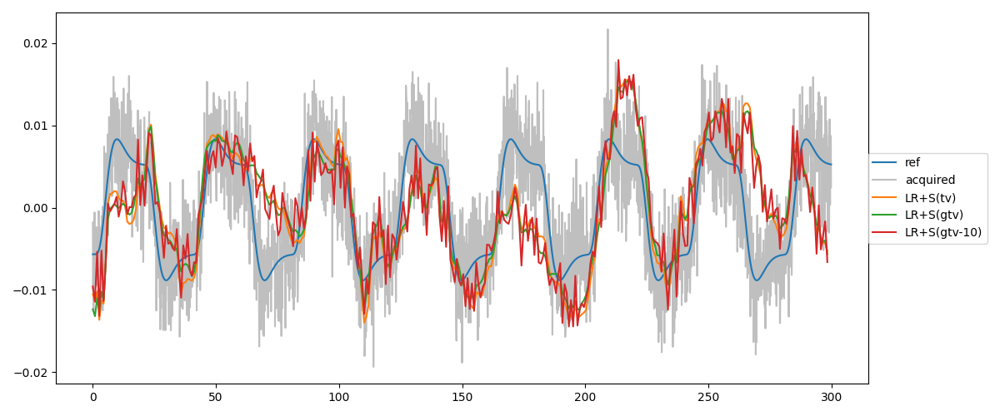

In [44]:
fig, ax = plt.subplots(figsize= (12,5))
#RESULTS.pop("adjoint")
#RESULTS.pop("sequential")
#RESULTS.pop("L+S(otazo)")
#RESULTS.pop("L+S(pogm)_0.1")
#RESULTS2= {}
#RESULTS2["L+S(pogm)"] = 
#ax = plot_ts_roi_many({k:v for k,v in RESULTS.items() if k not in ["L+S(pogm)"]}, sim, roi_idx=None, center=True, ax=ax)
ax = plot_ts_roi_many(RESULTS, sim, roi_idx=3, center=True, ax=ax)
fig.tight_layout()

### Group Total TV

# Validation with statistical analysis

In [ ]:
from simfmri.runner.stats import contrast_zscore
from matplotlib.lines import Line2D

from fmri.visualisation.images import _make_grid_plot

from sklearn.metrics import auc

def _init_roc_plot(xlabel, ylabel, luck=True, ax=None):
    if ax is None:
        fig, ax = plt.subplots()
    eps=0.05
    ax.set_xlim(-eps, 1 +eps)
    ax.set_ylim(-eps, 1 +eps)
    ax.set_aspect('equal')
    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)
    ax.grid("on")
    if luck:
        ax.plot([[0,0],[1,1]], c="gray", ls="dashed", lw=1)
    return fig, ax


stat_conf_solo = {
"contrast_name": "block_on",
"height_control": "fpr",
"stat_type": "t",
}

In [ ]:
from scipy.stats import norm
z_0001 = norm.isf(0.05)
print(z_0001)

In [ ]:
from sklearn.metrics import  roc_curve, average_precision_score, precision_recall_curve, PrecisionRecallDisplay, RocCurveDisplay

In [ ]:
fig, ax = _init_roc_plot("FPR", "TPR")
aucs = []
raw_label = []
for l in RESULTS:
    if l in ["ref","acquired"]:
        continue
    z_image= contrast_zscore(RESULTS[l], sim, **stat_conf_solo)
    fpr, tpr, thresh = roc_curve(sim.roi.flatten(), z_image.flatten())
    auc_val = auc(fpr, tpr)
    aucs.append(auc_val)
    raw_label.append(l)
    line=ax.plot(fpr, tpr, label=f"{l} (AUC={auc_val:.2f})",)
    closest_thres=abs(thresh-z_0001)
    idx0001 = np.flatnonzero(closest_thres == closest_thres.min()).max()-1

    ax.plot(fpr[idx0001], tpr[idx0001], marker="o",c=line[0].get_color())
handles, labels = ax.get_legend_handles_labels()

#ax.legend(handles, labels, loc="lower right", markerfirst=False)
ax.set_title(rf"res={sim.shape}, TR={sim.extra_infos['TR_ms']/1000:.1f}s, "
             f"R={sim.extra_infos['traj_params']['accel']}, SNR={int(sim.extra_infos['input_snr'])}")

# handles.append(Line2D([0,0], [0,0], c='k', marker='o', markersize=5, linestyle='none', fillstyle='none', markeredgewidth=1.5))
# labels.append("$p <0.05$")
# Create a Custom Legend using a inset ax
raw_label = ["adjoint", "sequential", "otazo LR+S", "pogm LR+S"]
legend_data = [[l, f"{a:.2f}", h] for l,a,h in zip(raw_label, aucs, handles)]
legend_data.insert(0, ["solver", "AUC", None])
legend_data.append(["$p<0.05$", None, Line2D([0,0], [0,0], c='k', marker='o', markersize=3, linestyle='none', markeredgewidth=1.5)])

print(legend_data)
colwidths = [0.4, 0.2, 0.15, 0.15]
colalign = ["right", "right", "center"]
colstyle = ["normal", "italic", None]
row_height = [0.1]+[0.15] * (len(legend_data)-1)
ins = ax.inset_axes([0.43,-0.03,0.6,0.35], transform=ax.transData)
padleft=0.05
padtop= 0#0.05
ins.tick_params(bottom=False, left=False, labelbottom=False, labelleft=False)

for spine in ins.spines.values():
    spine.set_edgecolor('gray')
    
for r in range(len(legend_data)):
    for c in range(len(legend_data[0]) -1):
        txt = legend_data[r][c]
        if txt is None:
            continue
        ins.text(padleft+np.sum(colwidths[:c+1]),1-padtop - np.sum(row_height[:r+1]), txt, 
                 ha=colalign[c],
                 va="bottom" if r == 0 else "center", 
                 fontweight="bold" if r ==0 else "normal",
                 fontstyle=colstyle[c])
    line=legend_data[r][-1]
    if line is None:
        continue
    y = 1 - padtop - np.sum(row_height[:r+1])
    x1 = np.sum(colwidths[:-1])
    x3 = x1 + colwidths[-1] 
    x2 = (x1 + x3) /2
    ins.set_xlim(0,1)
    ins.set_ylim(0,1)
    ins.plot([x1,x3],[y,y], c=line.get_color(), ls=line.get_linestyle())
    ins.plot(x2,y, c=line.get_color(), ls=line.get_linestyle(), marker=line.get_marker())

In [ ]:
# https://stackoverflow.com/questions/31478077/how-to-make-two-markers-share-the-same-label-in-the-legend-using-matplotlib
# https://stackoverflow.com/questions/28739608/completely-custom-legend-in-matplotlib-python